In [1]:
import os
import random
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
from sklearn.metrics import jaccard_score
from torchvision import transforms
import numpy as np

# Set random seed for reproducibility
def seed_everything(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything()

class SegmentationDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")

        if self.transform:
            image = self.transform(image)
            mask = transforms.Resize((256, 256))(mask)
            mask = transforms.ToTensor()(mask)

        return image, mask

# Define transformations
train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
    transforms.ToTensor(),
])

val_test_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

# Load dataset paths
image_dir = "/kaggle/input/kvasir-seg/Kvasir-SEG/images"
mask_dir = "/kaggle/input/kvasir-seg/Kvasir-SEG/masks"

images = sorted(os.listdir(image_dir))
masks = sorted(os.listdir(mask_dir))

image_paths = [os.path.join(image_dir, img) for img in images]
mask_paths = [os.path.join(mask_dir, mask) for mask in masks]

# Split into train (85%), validation (10%), and test (5%)
train_imgs, temp_imgs, train_masks, temp_masks = train_test_split(image_paths, mask_paths, test_size=0.15, random_state=42)
val_imgs, test_imgs, val_masks, test_masks = train_test_split(temp_imgs, temp_masks, test_size=0.3333, random_state=42)

# Initialize datasets
train_dataset = SegmentationDataset(train_imgs, train_masks, transform=train_transform)
val_dataset = SegmentationDataset(val_imgs, val_masks, transform=val_test_transform)
test_dataset = SegmentationDataset(test_imgs, test_masks, transform=val_test_transform)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)


In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F


# --- Residual ConvBlock ---
class ResidualConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.0):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
        )
        self.relu = nn.ReLU(inplace=True)
        self.skip = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()

    def forward(self, x):
        residual = self.skip(x)
        out = self.conv(x)
        return self.relu(out + residual)


# --- Attention Block ---
class AttentionBlock(nn.Module):
    def __init__(self, f_g, f_l, f_int):
        super().__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(f_g, f_int, 1, bias=False),
            nn.BatchNorm2d(f_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(f_l, f_int, 1, bias=False),
            nn.BatchNorm2d(f_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(f_int, 1, 1, bias=False),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        return x * self.psi(self.relu(self.W_g(g) + self.W_x(x)))


# --- CBAM ---
class ChannelAttention(nn.Module):
    def __init__(self, in_planes, ratio=8):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.shared_MLP = nn.Sequential(
            nn.Conv2d(in_planes, in_planes // ratio, 1, bias=False),
            nn.ReLU(),
            nn.Conv2d(in_planes // ratio, in_planes, 1, bias=False)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        return self.sigmoid(self.shared_MLP(self.avg_pool(x)) + self.shared_MLP(self.max_pool(x)))


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        padding = kernel_size // 2
        self.conv = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        return self.sigmoid(self.conv(torch.cat([avg_out, max_out], dim=1)))


class CBAM(nn.Module):
    def __init__(self, channels, reduction=8, spatial_kernel=7):
        super().__init__()
        self.ca = ChannelAttention(channels, reduction)
        self.sa = SpatialAttention(spatial_kernel)

    def forward(self, x):
        return x * self.ca(x) * self.sa(x)


# --- Up + Conv ---
class UpConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.up(x)


# --- Morphological Gradient Boundary Refinement Module (BRM) ---
class MorphologicalGradientBRM(nn.Module):
    def __init__(self, kernel_size=3):
        super().__init__()
        self.kernel_size = kernel_size
        self.padding = kernel_size // 2
        self.dilate = nn.MaxPool2d(kernel_size, stride=1, padding=self.padding)
        self.erode = nn.MaxPool2d(kernel_size, stride=1, padding=self.padding)

    def forward(self, x):
        dilation = self.dilate(x)
        erosion = -self.erode(-x)
        boundary = dilation - erosion
        return x + boundary  # refine boundaries


# --- Attention UNet++ with BRM ---
class AttentionUNetPlusPlus(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, feature_scale=1, dropout=0.0):
        super().__init__()

        filters = [64, 128, 256, 512, 1024]
        filters = [int(x / feature_scale) for x in filters]

        self.pool = nn.MaxPool2d(2, 2)

        self.encoder1 = ResidualConvBlock(in_channels, filters[0], dropout)
        self.encoder2 = ResidualConvBlock(filters[0], filters[1], dropout)
        self.encoder3 = ResidualConvBlock(filters[1], filters[2], dropout)
        self.encoder4 = ResidualConvBlock(filters[2], filters[3], dropout)
        self.center = ResidualConvBlock(filters[3], filters[4], dropout)

        self.att4 = AttentionBlock(filters[3], filters[3], filters[2])
        self.up4 = UpConv(filters[4], filters[3])
        self.decoder4 = ResidualConvBlock(filters[4], filters[3], dropout)
        self.cbam4 = CBAM(filters[3])

        self.att3 = AttentionBlock(filters[2], filters[2], filters[1])
        self.up3 = UpConv(filters[3], filters[2])
        self.decoder3 = ResidualConvBlock(filters[3], filters[2], dropout)
        self.cbam3 = CBAM(filters[2])

        self.att2 = AttentionBlock(filters[1], filters[1], filters[0])
        self.up2 = UpConv(filters[2], filters[1])
        self.decoder2 = ResidualConvBlock(filters[2], filters[1], dropout)
        self.cbam2 = CBAM(filters[1])

        self.att1 = AttentionBlock(filters[0], filters[0], filters[0] // 2)
        self.up1 = UpConv(filters[1], filters[0])
        self.decoder1 = ResidualConvBlock(filters[1], filters[0], dropout)
        self.cbam1 = CBAM(filters[0])

        # Multi-scale inputs
        self.input_down1 = nn.AvgPool2d(2)
        self.input_down2 = nn.AvgPool2d(4)
        self.input_down3 = nn.AvgPool2d(8)

        # Output layers
        self.out1 = nn.Conv2d(filters[0], out_channels, 1)
        self.out2 = nn.Conv2d(filters[1], out_channels, 1)
        self.out3 = nn.Conv2d(filters[2], out_channels, 1)
        self.out4 = nn.Conv2d(filters[3], out_channels, 1)

        # BRM
        self.brm = MorphologicalGradientBRM(kernel_size=3)

    def forward(self, x):
        # Multi-scale input fusion
        x1 = x
        x2 = F.interpolate(self.input_down1(x), scale_factor=2, mode='bilinear', align_corners=True)
        x3 = F.interpolate(self.input_down2(x), scale_factor=4, mode='bilinear', align_corners=True)
        x4 = F.interpolate(self.input_down3(x), scale_factor=8, mode='bilinear', align_corners=True)
        x = (x1 + x2 + x3 + x4) / 4

        e1 = self.encoder1(x)
        e2 = self.encoder2(self.pool(e1))
        e3 = self.encoder3(self.pool(e2))
        e4 = self.encoder4(self.pool(e3))
        center = self.center(self.pool(e4))

        d4 = self.up4(center)
        e4 = self.att4(d4, e4)
        d4 = self.decoder4(torch.cat([d4, e4], dim=1))
        d4 = self.cbam4(d4)

        d3 = self.up3(d4)
        e3 = self.att3(d3, e3)
        d3 = self.decoder3(torch.cat([d3, e3], dim=1))
        d3 = self.cbam3(d3)

        d2 = self.up2(d3)
        e2 = self.att2(d2, e2)
        d2 = self.decoder2(torch.cat([d2, e2], dim=1))
        d2 = self.cbam2(d2)

        d1 = self.up1(d2)
        e1 = self.att1(d1, e1)
        d1 = self.decoder1(torch.cat([d1, e1], dim=1))
        d1 = self.cbam1(d1)

        out_main = self.out1(d1)
        out_main_refined = self.brm(out_main)  # Apply BRM

        # Deep supervision
        out_aux1 = F.interpolate(self.out2(d2), size=out_main.shape[2:], mode='bilinear', align_corners=True)
        out_aux2 = F.interpolate(self.out3(d3), size=out_main.shape[2:], mode='bilinear', align_corners=True)
        out_aux3 = F.interpolate(self.out4(d4), size=out_main.shape[2:], mode='bilinear', align_corners=True)

        return out_main_refined, out_aux1, out_aux2, out_aux3


# --- Test the model ---
if __name__ == "__main__":
    model = AttentionUNetPlusPlus(in_channels=1, out_channels=1, dropout=0.1)
    x = torch.randn(1, 1, 256, 256)
    outputs = model(x)
    for i, out in enumerate(outputs):
        print(f"Output {i+1} shape: {out.shape}")


Output 1 shape: torch.Size([1, 1, 256, 256])
Output 2 shape: torch.Size([1, 1, 256, 256])
Output 3 shape: torch.Size([1, 1, 256, 256])
Output 4 shape: torch.Size([1, 1, 256, 256])


In [3]:

epochs = 100
lr = 1e-4

In [4]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
from tqdm import tqdm

def visualize_predictions(loader, title, save_path=None):
    model.eval()
    with torch.no_grad():
        inputs, targets = next(iter(loader))
        inputs, targets = inputs.to(device), targets.to(device)

        raw_outputs = model(inputs)
        if isinstance(raw_outputs, tuple):
            main_output = raw_outputs[0]
        else:
            main_output = raw_outputs

        outputs = (torch.sigmoid(main_output) > 0.5).float()

        fig, axes = plt.subplots(3, 5, figsize=(15, 9))
        for i in range(5):
            img = inputs[i].cpu().permute(1, 2, 0) if inputs.shape[1] == 3 else inputs[i, 0].cpu()
            axes[0, i].imshow(img, cmap='gray' if inputs.shape[1] == 1 else None)
            axes[1, i].imshow(targets[i].cpu().squeeze(), cmap='gray')
            axes[2, i].imshow(outputs[i].cpu().squeeze(), cmap='gray')
            for ax in axes[:, i]:
                ax.axis("off")

        plt.suptitle(title)
        plt.tight_layout()
        if save_path:
            plt.savefig(save_path)
        plt.show()


# --- Hyperparameters ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



# --- Model, Optimizer ---
model = AttentionUNetPlusPlus(in_channels=3, out_channels=1).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)


Epoch 1/100: 100%|██████████| 107/107 [01:25<00:00,  1.25it/s, loss=4.26]



Epoch 1: Train Loss=6.1739 | Val Loss=4.2909 | Dice=0.4848 | IoU=0.3510

✅ Best model saved: checkpoints/best_model_epoch1_dice0.4848.pth


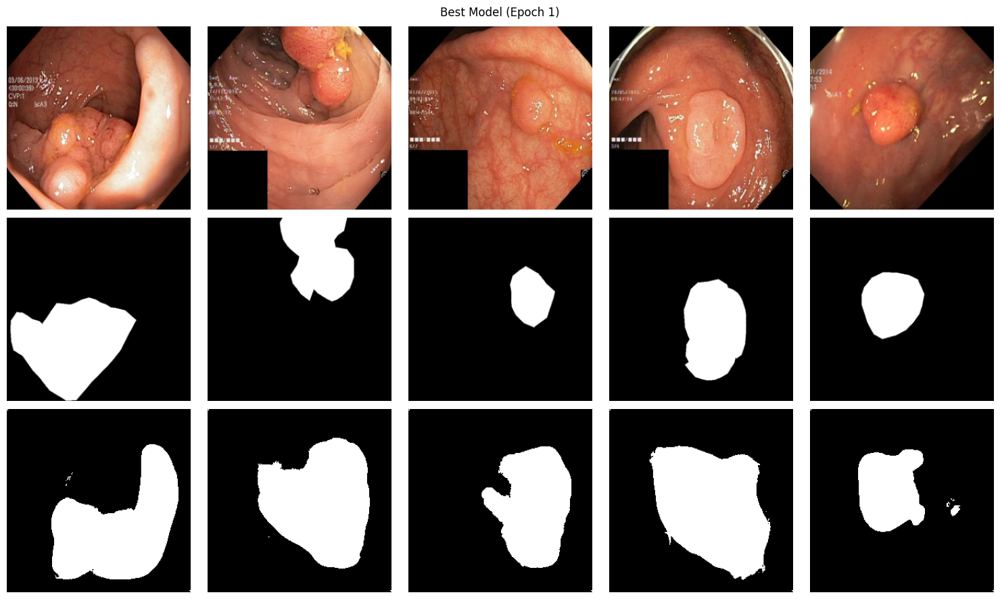

Epoch 2/100: 100%|██████████| 107/107 [01:15<00:00,  1.42it/s, loss=4.53]



Epoch 2: Train Loss=4.0424 | Val Loss=2.8689 | Dice=0.0355 | IoU=0.0206



Epoch 3/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.72]



Epoch 3: Train Loss=3.9099 | Val Loss=4.0821 | Dice=0.4964 | IoU=0.3579

✅ Best model saved: checkpoints/best_model_epoch3_dice0.4964.pth


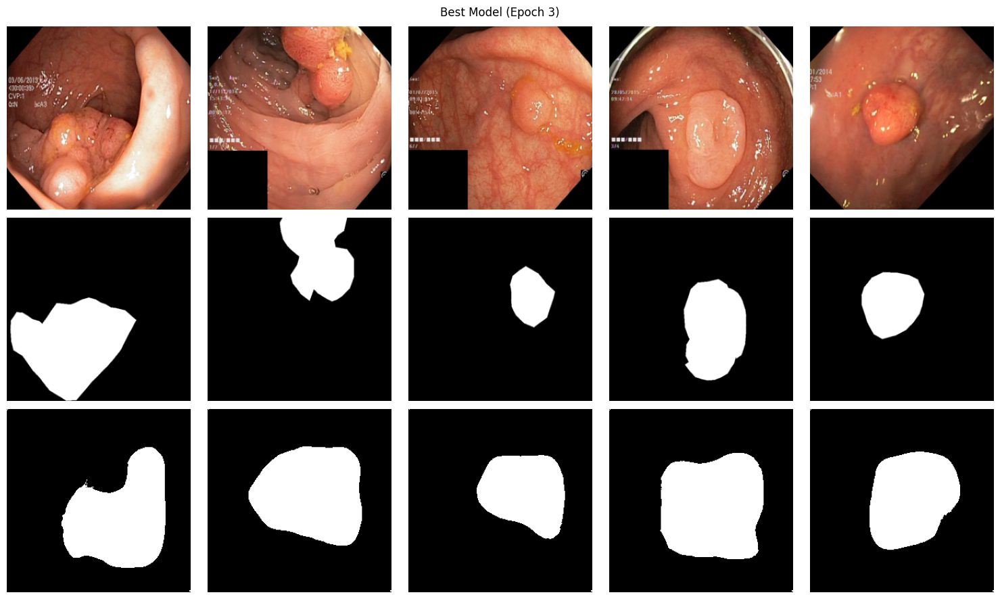

Epoch 4/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=3.35]



Epoch 4: Train Loss=3.8830 | Val Loss=3.5792 | Dice=0.4372 | IoU=0.3090



Epoch 5/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.34]



Epoch 5: Train Loss=3.8442 | Val Loss=3.8654 | Dice=0.4750 | IoU=0.3401



Epoch 6/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.72]



Epoch 6: Train Loss=3.8609 | Val Loss=3.7531 | Dice=0.4936 | IoU=0.3585



Epoch 7/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.92]



Epoch 7: Train Loss=3.8191 | Val Loss=3.5233 | Dice=0.4787 | IoU=0.3534



Epoch 8/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.47]



Epoch 8: Train Loss=3.8016 | Val Loss=3.7224 | Dice=0.4950 | IoU=0.3641



Epoch 9/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=4.09]



Epoch 9: Train Loss=3.8173 | Val Loss=3.6596 | Dice=0.5027 | IoU=0.3724

✅ Best model saved: checkpoints/best_model_epoch9_dice0.5027.pth


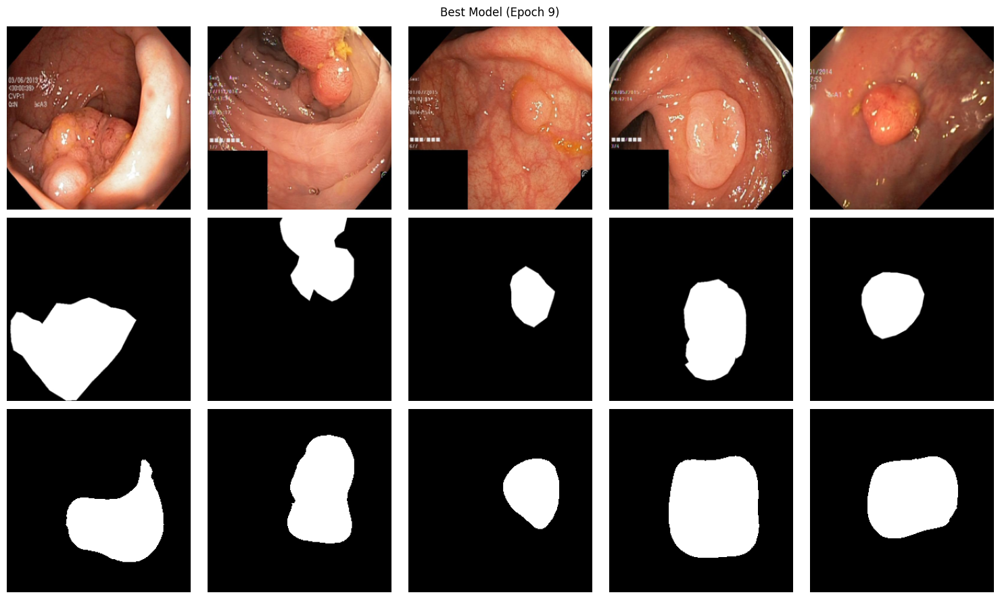

Epoch 10/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.66]



Epoch 10: Train Loss=3.8064 | Val Loss=3.4829 | Dice=0.5117 | IoU=0.3785

✅ Best model saved: checkpoints/best_model_epoch10_dice0.5117.pth


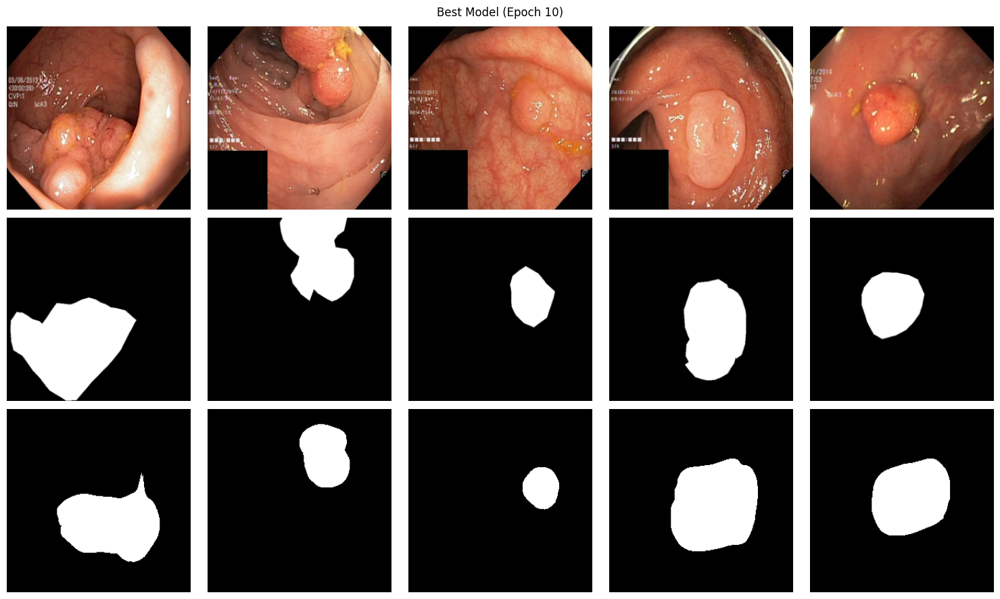

Epoch 11/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=4.03]



Epoch 11: Train Loss=3.8175 | Val Loss=3.8482 | Dice=0.5379 | IoU=0.3995

✅ Best model saved: checkpoints/best_model_epoch11_dice0.5379.pth


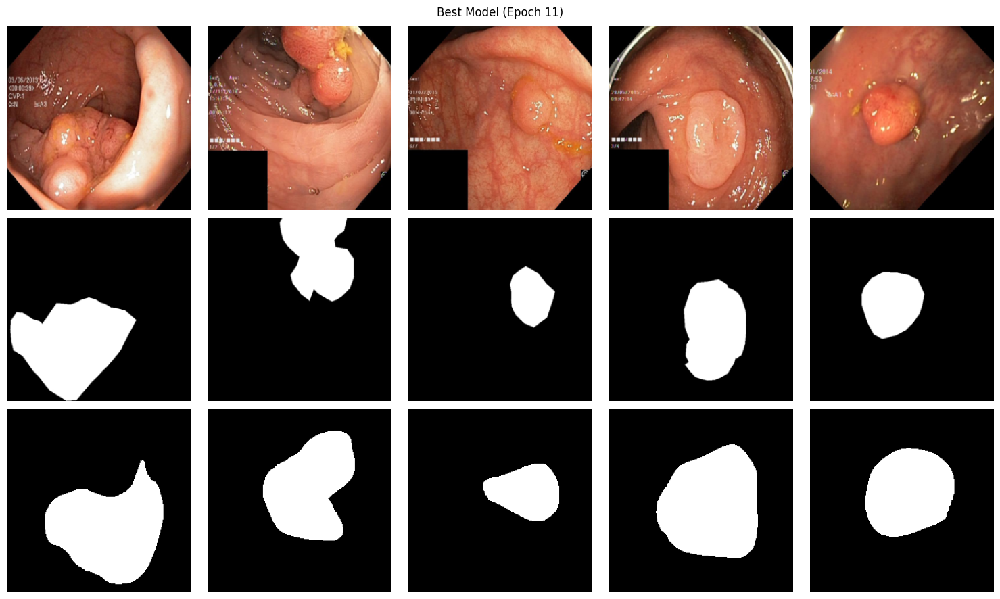

Epoch 12/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=3.74]



Epoch 12: Train Loss=3.8191 | Val Loss=3.7172 | Dice=0.5142 | IoU=0.3763



Epoch 13/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=4.33]



Epoch 13: Train Loss=3.7711 | Val Loss=3.3485 | Dice=0.4848 | IoU=0.3548



Epoch 14/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=4.59]



Epoch 14: Train Loss=3.8126 | Val Loss=3.6308 | Dice=0.5143 | IoU=0.3785



Epoch 15/100: 100%|██████████| 107/107 [01:15<00:00,  1.42it/s, loss=3.53]



Epoch 15: Train Loss=3.7611 | Val Loss=3.5426 | Dice=0.5402 | IoU=0.4060

✅ Best model saved: checkpoints/best_model_epoch15_dice0.5402.pth


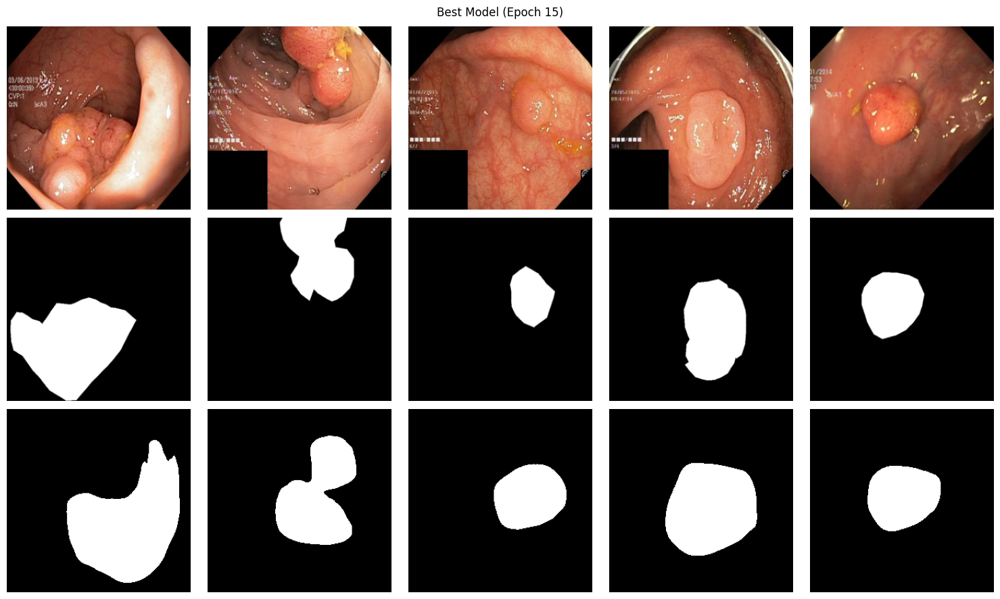

Epoch 16/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.38]



Epoch 16: Train Loss=3.7685 | Val Loss=3.4503 | Dice=0.5157 | IoU=0.3850



Epoch 17/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.93]



Epoch 17: Train Loss=3.7500 | Val Loss=3.4839 | Dice=0.5583 | IoU=0.4226

✅ Best model saved: checkpoints/best_model_epoch17_dice0.5583.pth


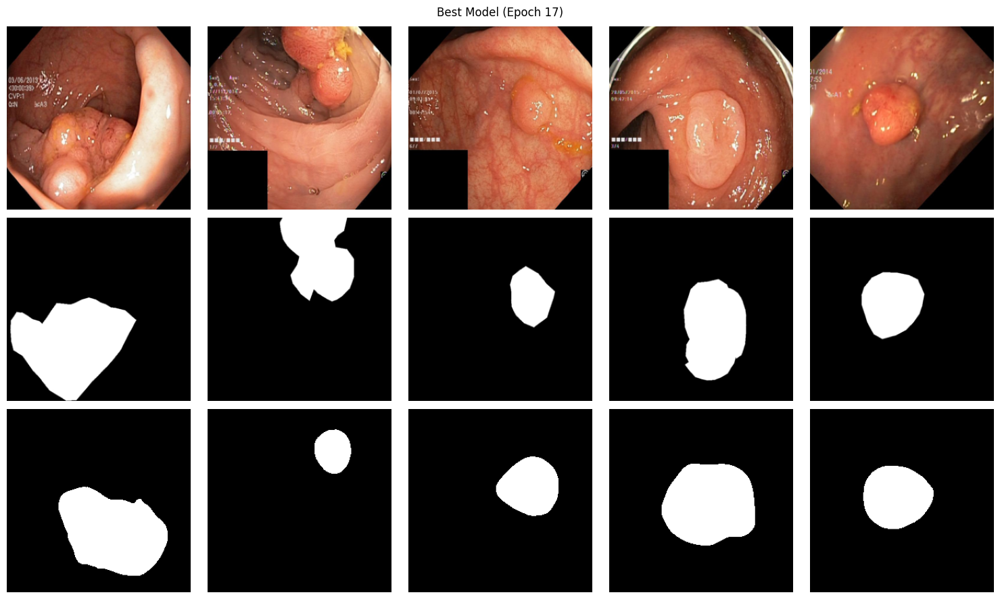

Epoch 18/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.89]



Epoch 18: Train Loss=3.7729 | Val Loss=3.5567 | Dice=0.5720 | IoU=0.4328

✅ Best model saved: checkpoints/best_model_epoch18_dice0.5720.pth


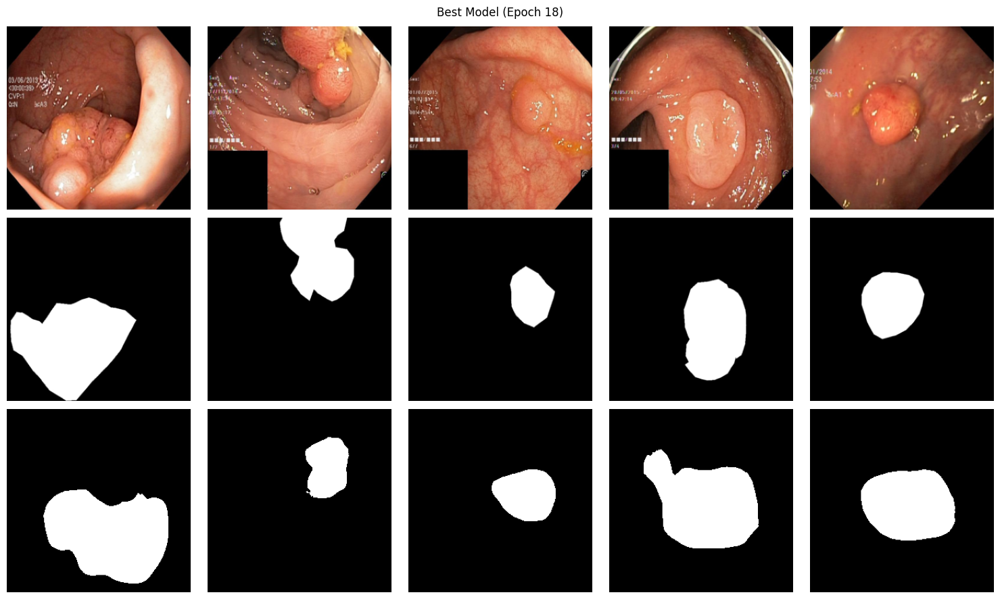

Epoch 19/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=4.32]



Epoch 19: Train Loss=3.7566 | Val Loss=3.5115 | Dice=0.5739 | IoU=0.4381

✅ Best model saved: checkpoints/best_model_epoch19_dice0.5739.pth


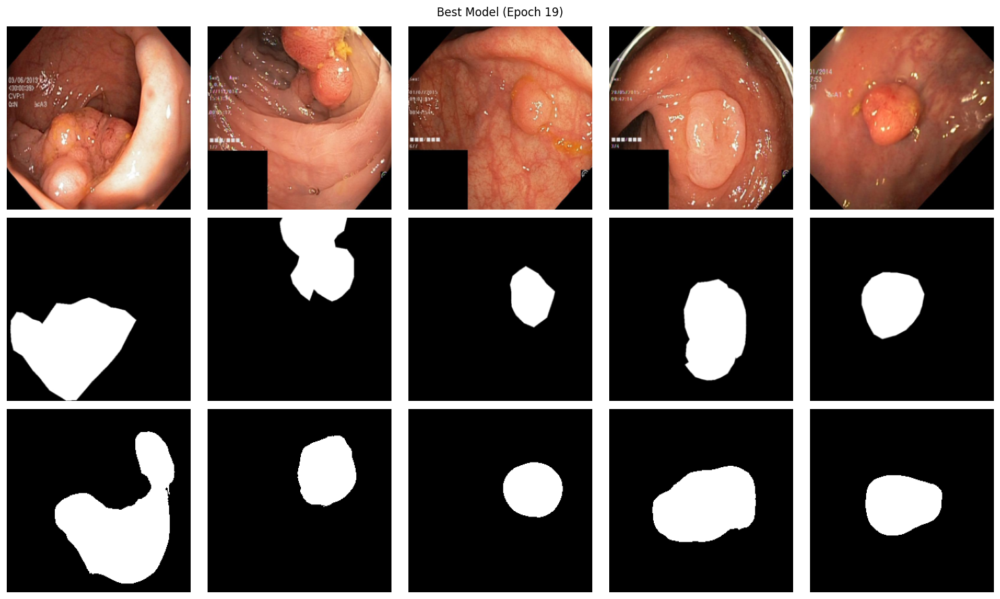

Epoch 20/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.37]



Epoch 20: Train Loss=3.7687 | Val Loss=3.5143 | Dice=0.5783 | IoU=0.4437

✅ Best model saved: checkpoints/best_model_epoch20_dice0.5783.pth


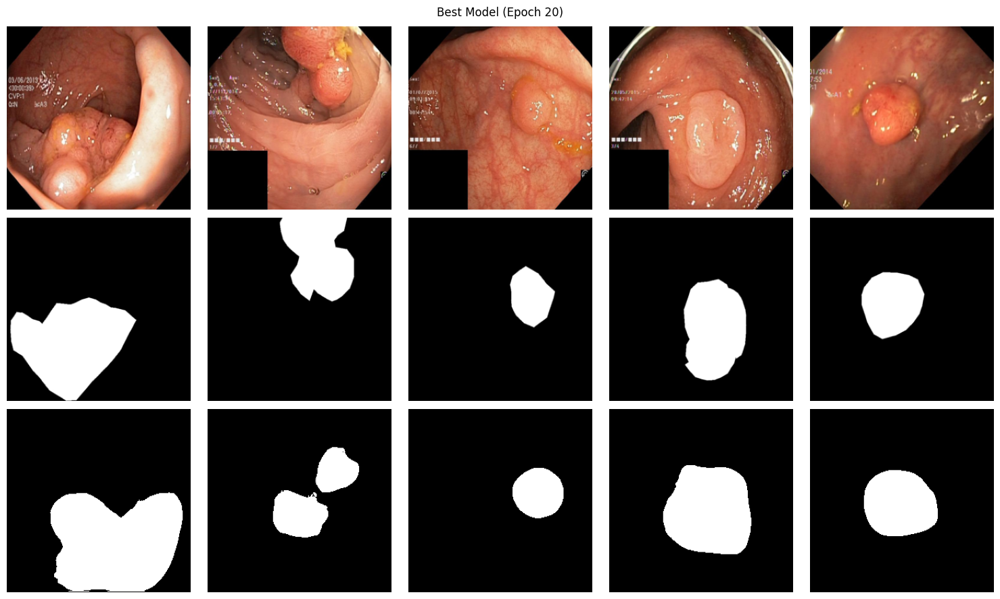

Epoch 21/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.95]



Epoch 21: Train Loss=3.7246 | Val Loss=3.4079 | Dice=0.5718 | IoU=0.4405



Epoch 22/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=4.68]



Epoch 22: Train Loss=3.7522 | Val Loss=3.4815 | Dice=0.5909 | IoU=0.4571

✅ Best model saved: checkpoints/best_model_epoch22_dice0.5909.pth


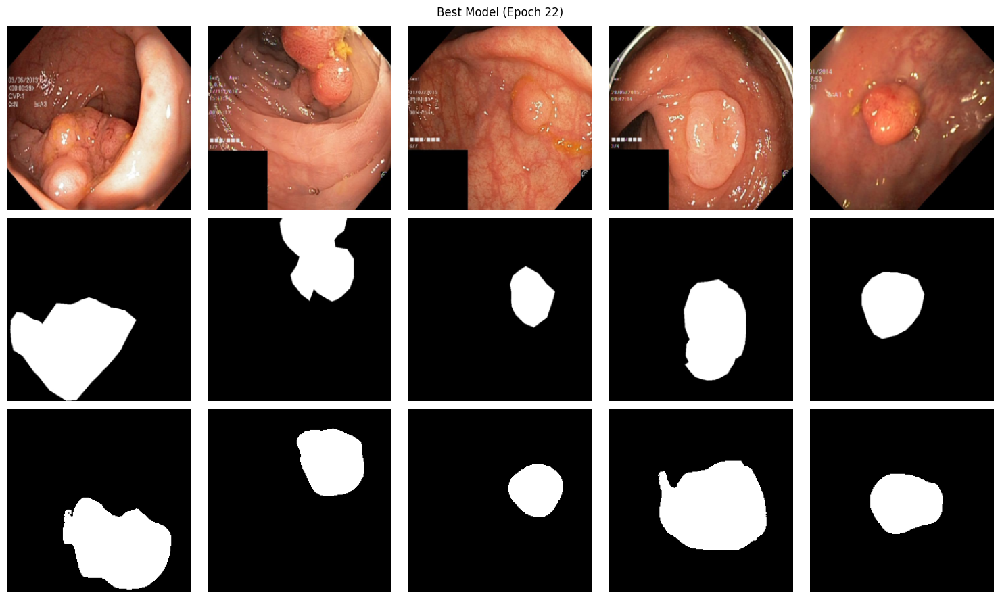

Epoch 23/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=4.24]



Epoch 23: Train Loss=3.7520 | Val Loss=3.3745 | Dice=0.5707 | IoU=0.4330



Epoch 24/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=3.65]



Epoch 24: Train Loss=3.6952 | Val Loss=3.4489 | Dice=0.5493 | IoU=0.4179



Epoch 25/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=4.87]



Epoch 25: Train Loss=3.7204 | Val Loss=3.6037 | Dice=0.6078 | IoU=0.4724

✅ Best model saved: checkpoints/best_model_epoch25_dice0.6078.pth


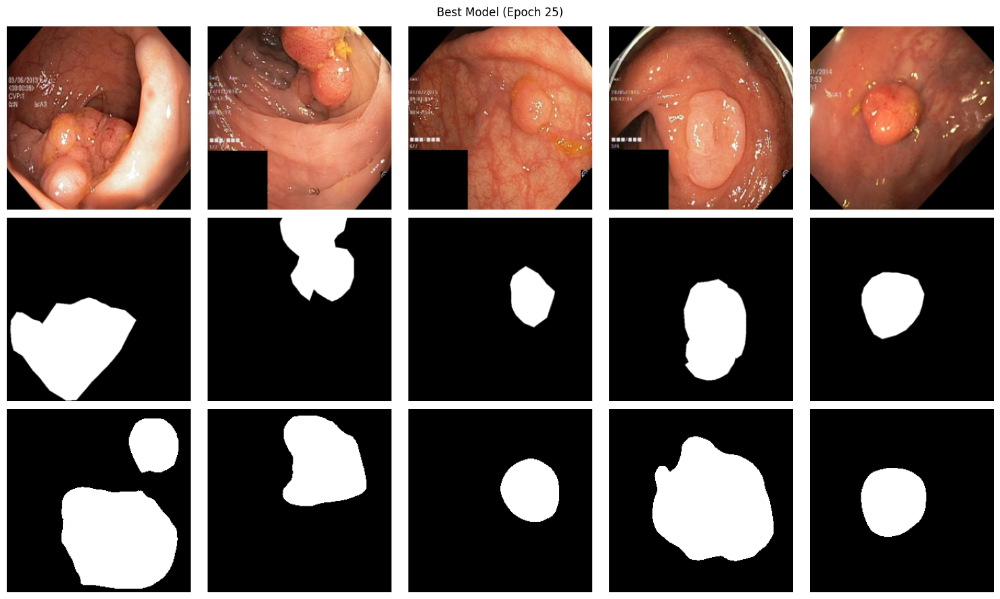

Epoch 26/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.23]



Epoch 26: Train Loss=3.7441 | Val Loss=3.3311 | Dice=0.5935 | IoU=0.4532



Epoch 27/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=2.78]



Epoch 27: Train Loss=3.7057 | Val Loss=3.4828 | Dice=0.6227 | IoU=0.4819

✅ Best model saved: checkpoints/best_model_epoch27_dice0.6227.pth


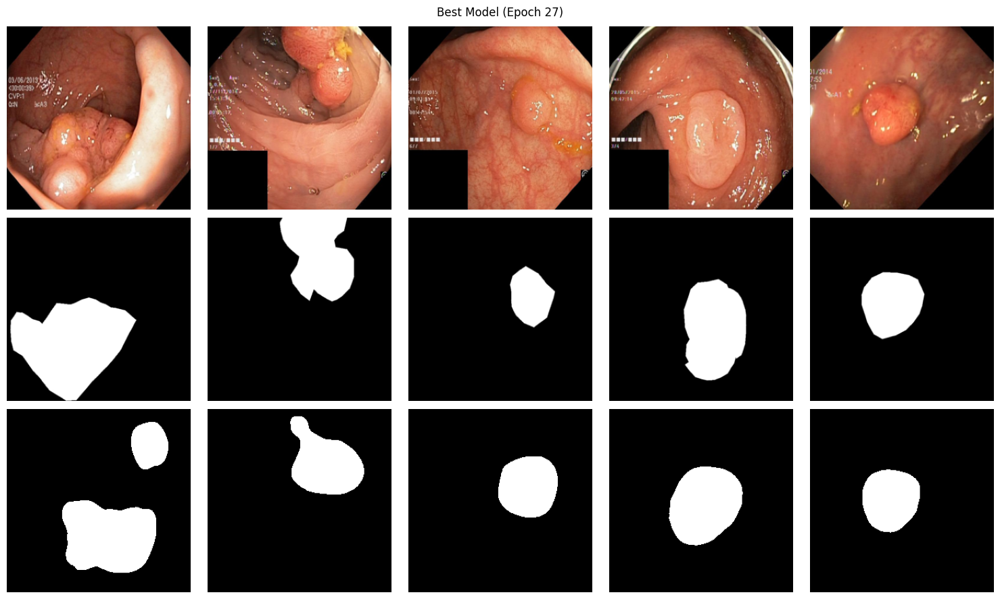

Epoch 28/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.84]



Epoch 28: Train Loss=3.7059 | Val Loss=3.4645 | Dice=0.6507 | IoU=0.5145

✅ Best model saved: checkpoints/best_model_epoch28_dice0.6507.pth


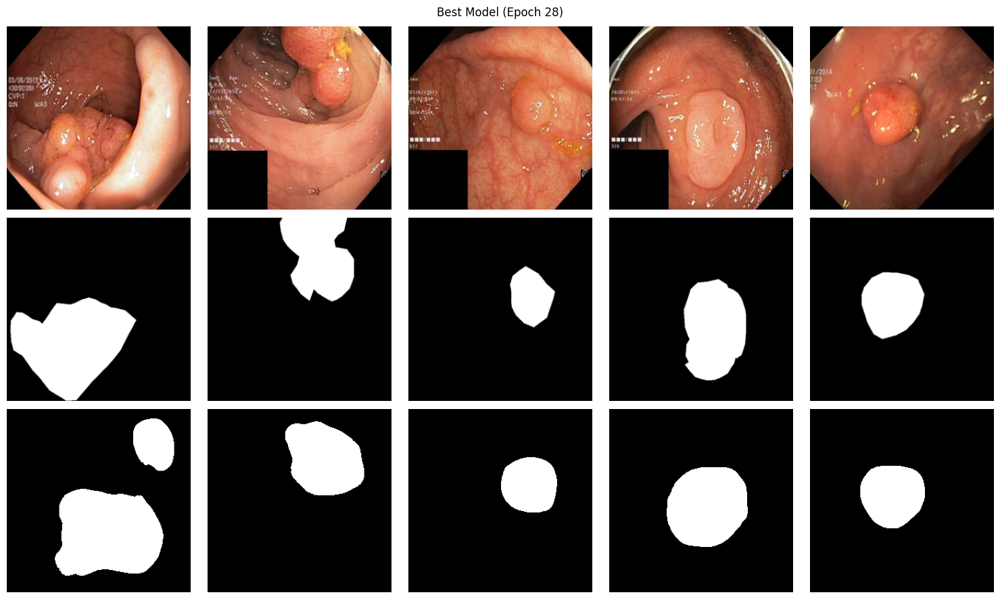

Epoch 29/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.57]



Epoch 29: Train Loss=3.6414 | Val Loss=3.7900 | Dice=0.5978 | IoU=0.4598



Epoch 30/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.21]



Epoch 30: Train Loss=3.7047 | Val Loss=3.2024 | Dice=0.6682 | IoU=0.5393

✅ Best model saved: checkpoints/best_model_epoch30_dice0.6682.pth


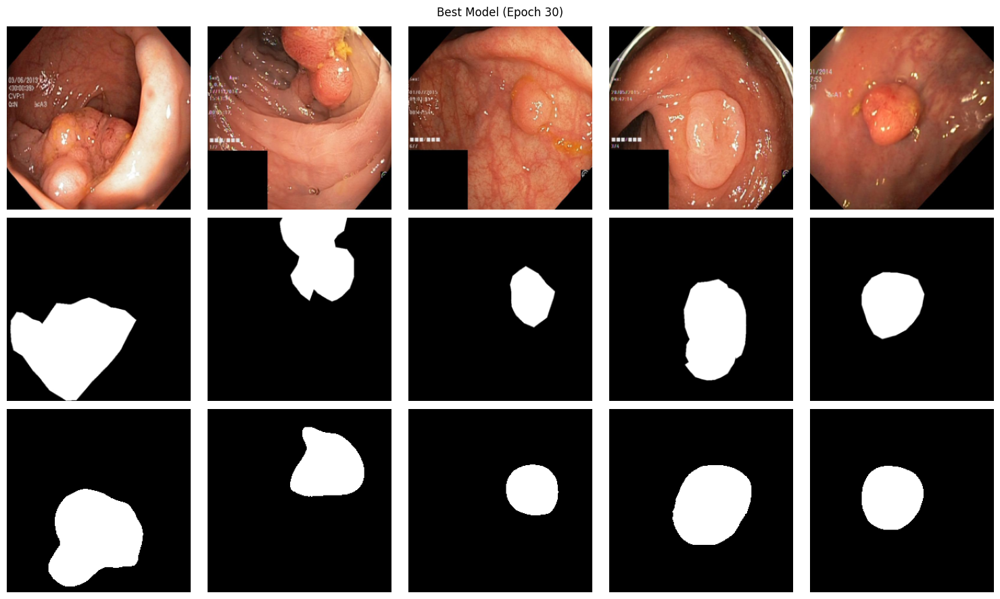

Epoch 31/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.54]



Epoch 31: Train Loss=3.6638 | Val Loss=3.4592 | Dice=0.6160 | IoU=0.4860



Epoch 32/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=4.15]



Epoch 32: Train Loss=3.6565 | Val Loss=3.5182 | Dice=0.6475 | IoU=0.5148



Epoch 33/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.09]



Epoch 33: Train Loss=3.6714 | Val Loss=3.4153 | Dice=0.6316 | IoU=0.4905



Epoch 34/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=4.03]



Epoch 34: Train Loss=3.6717 | Val Loss=3.5115 | Dice=0.6598 | IoU=0.5232



Epoch 35/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.5]



Epoch 35: Train Loss=3.6579 | Val Loss=3.4823 | Dice=0.6813 | IoU=0.5518

✅ Best model saved: checkpoints/best_model_epoch35_dice0.6813.pth


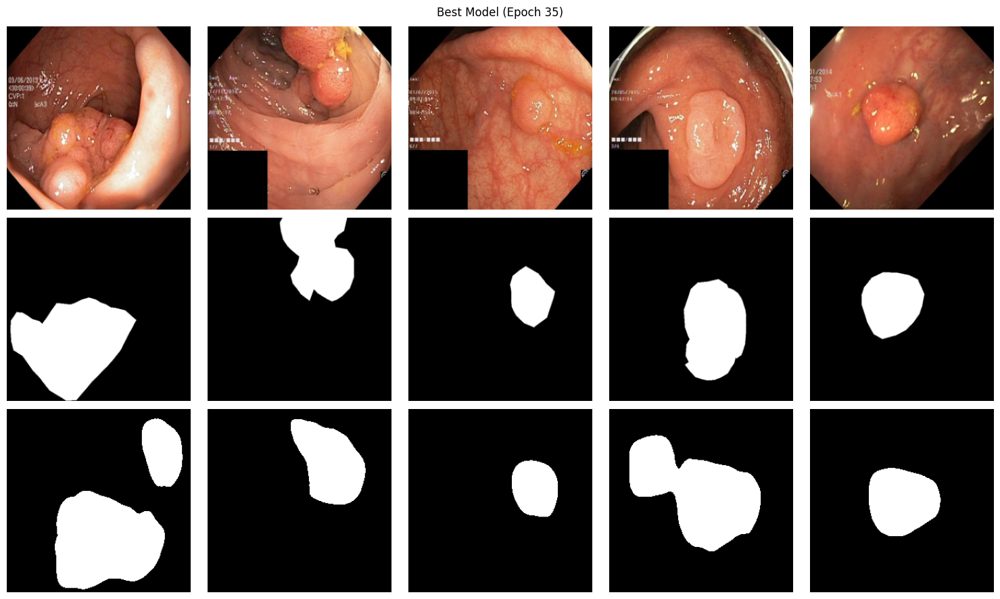

Epoch 36/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=4.71]



Epoch 36: Train Loss=3.6615 | Val Loss=3.2751 | Dice=0.6586 | IoU=0.5233



Epoch 37/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.53]



Epoch 37: Train Loss=3.6348 | Val Loss=3.2294 | Dice=0.7122 | IoU=0.5829

✅ Best model saved: checkpoints/best_model_epoch37_dice0.7122.pth


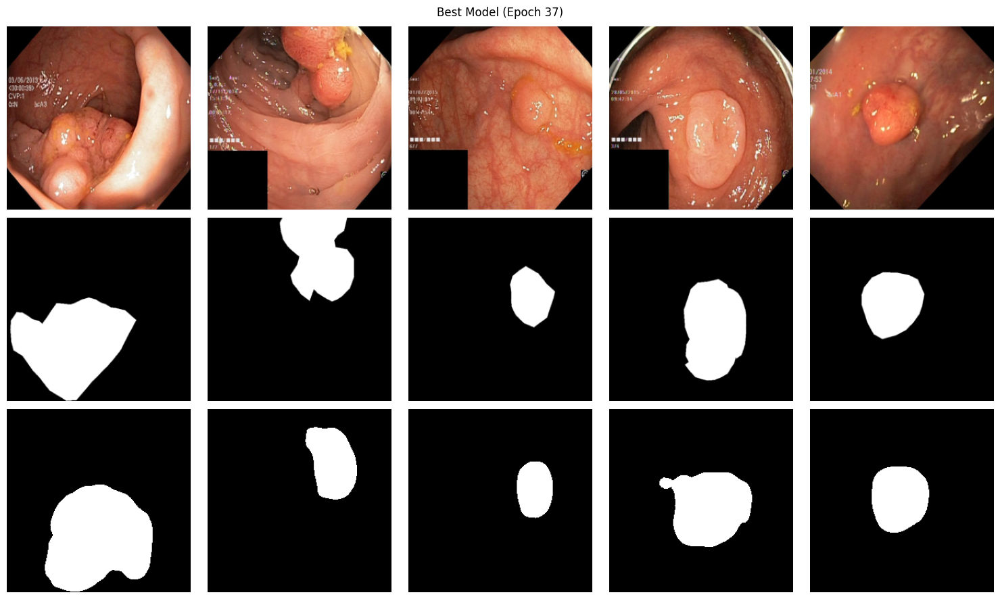

Epoch 38/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=4.89]



Epoch 38: Train Loss=3.6252 | Val Loss=3.3746 | Dice=0.6742 | IoU=0.5449



Epoch 39/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=4.1]



Epoch 39: Train Loss=3.6155 | Val Loss=3.1698 | Dice=0.7132 | IoU=0.5856

✅ Best model saved: checkpoints/best_model_epoch39_dice0.7132.pth


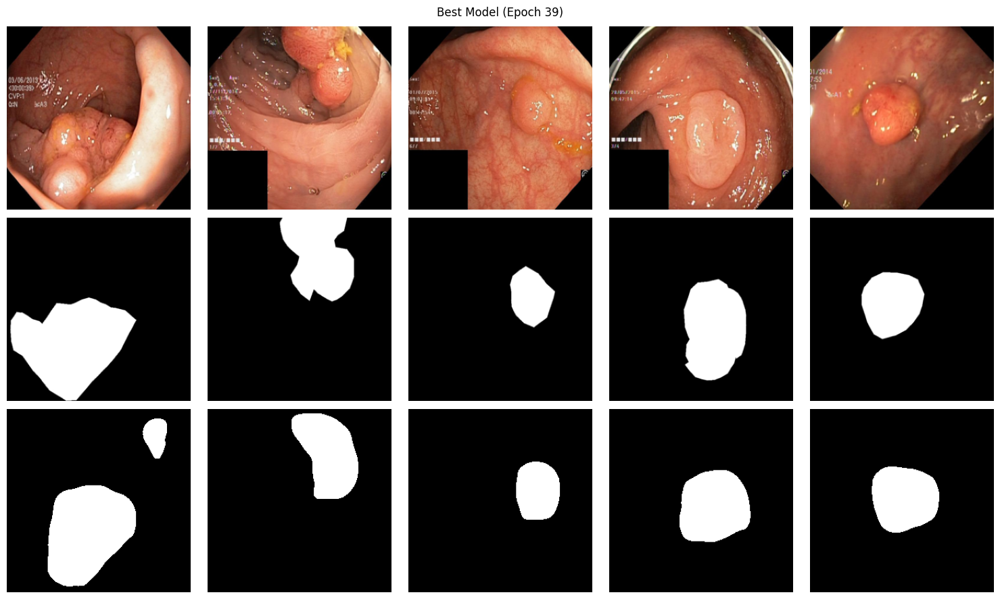

Epoch 40/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.65]



Epoch 40: Train Loss=3.5575 | Val Loss=3.2984 | Dice=0.6794 | IoU=0.5436



Epoch 41/100: 100%|██████████| 107/107 [01:15<00:00,  1.42it/s, loss=4.06]



Epoch 41: Train Loss=3.5807 | Val Loss=3.3955 | Dice=0.7110 | IoU=0.5826



Epoch 42/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.86]



Epoch 42: Train Loss=3.6005 | Val Loss=3.5203 | Dice=0.6508 | IoU=0.5090



Epoch 43/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.85]



Epoch 43: Train Loss=3.5503 | Val Loss=3.2230 | Dice=0.7117 | IoU=0.5851



Epoch 44/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=2.4]



Epoch 44: Train Loss=3.5281 | Val Loss=3.1797 | Dice=0.6329 | IoU=0.4855



Epoch 45/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=5.07]



Epoch 45: Train Loss=3.5221 | Val Loss=3.2746 | Dice=0.7172 | IoU=0.5924

✅ Best model saved: checkpoints/best_model_epoch45_dice0.7172.pth


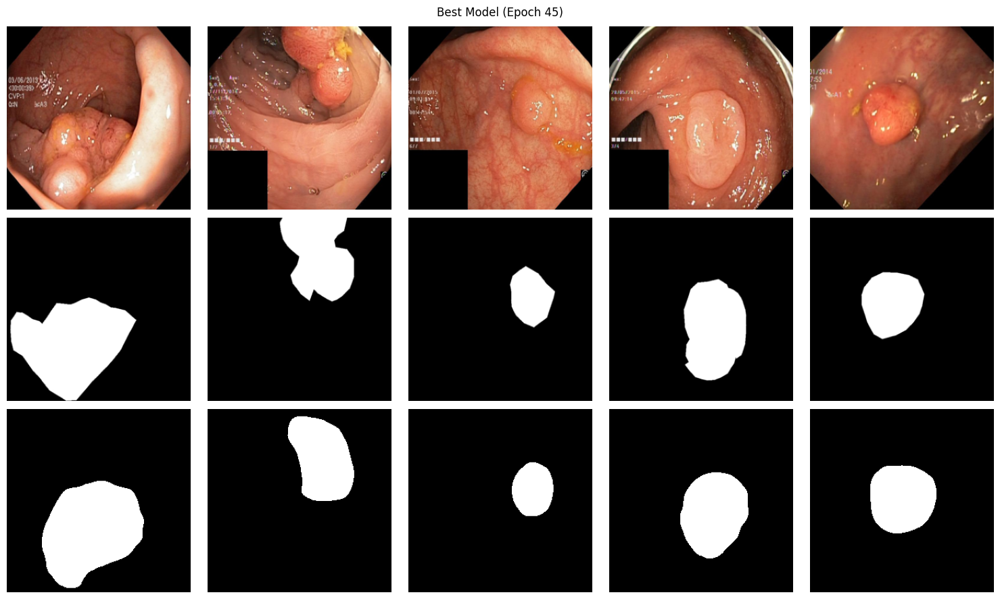

Epoch 46/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=4]



Epoch 46: Train Loss=3.4919 | Val Loss=3.2541 | Dice=0.7193 | IoU=0.5863

✅ Best model saved: checkpoints/best_model_epoch46_dice0.7193.pth


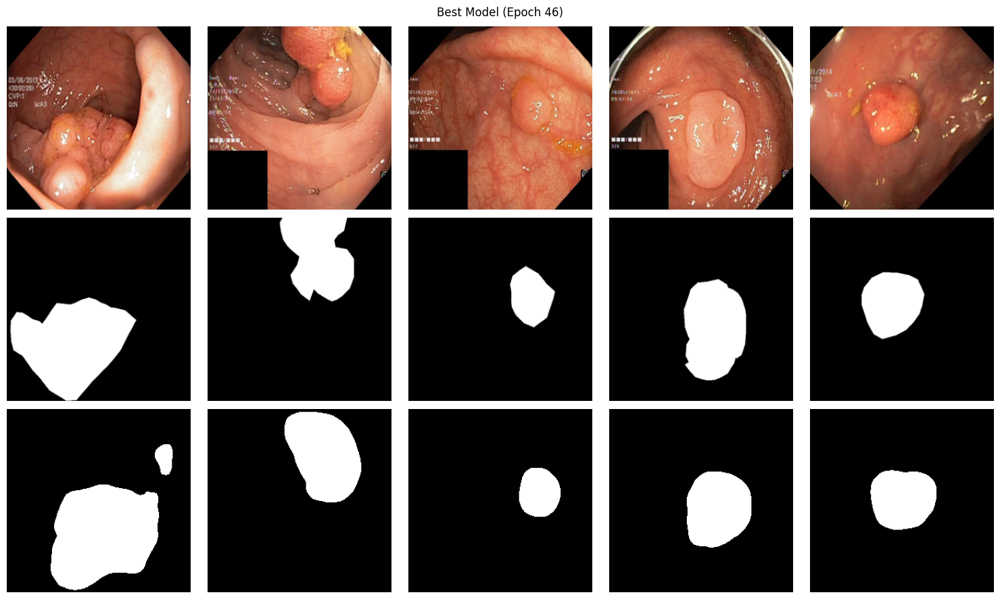

Epoch 47/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=2.27]



Epoch 47: Train Loss=3.4946 | Val Loss=3.4731 | Dice=0.6706 | IoU=0.5370



Epoch 48/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.43]



Epoch 48: Train Loss=3.4734 | Val Loss=3.2029 | Dice=0.6971 | IoU=0.5670



Epoch 49/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.38]



Epoch 49: Train Loss=3.4261 | Val Loss=3.1387 | Dice=0.6659 | IoU=0.5219



Epoch 50/100: 100%|██████████| 107/107 [01:16<00:00,  1.39it/s, loss=3.24]



Epoch 50: Train Loss=3.4418 | Val Loss=3.3257 | Dice=0.6998 | IoU=0.5711



Epoch 51/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=4.58]



Epoch 51: Train Loss=3.4292 | Val Loss=3.1809 | Dice=0.6603 | IoU=0.5225



Epoch 52/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=2.7]



Epoch 52: Train Loss=3.3887 | Val Loss=3.1126 | Dice=0.7273 | IoU=0.5982

✅ Best model saved: checkpoints/best_model_epoch52_dice0.7273.pth


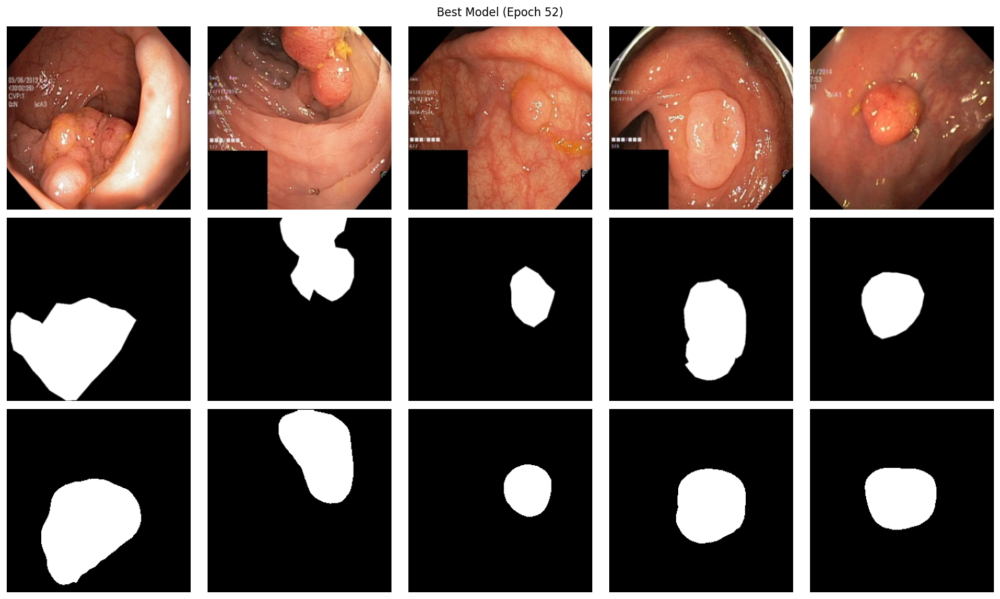

Epoch 53/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=4.72]



Epoch 53: Train Loss=3.3951 | Val Loss=3.1560 | Dice=0.7164 | IoU=0.5905



Epoch 54/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=2.96]



Epoch 54: Train Loss=3.3721 | Val Loss=2.9808 | Dice=0.6835 | IoU=0.5469



Epoch 55/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.63]



Epoch 55: Train Loss=3.3721 | Val Loss=3.0003 | Dice=0.7059 | IoU=0.5731



Epoch 56/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.19]



Epoch 56: Train Loss=3.3779 | Val Loss=3.2232 | Dice=0.7041 | IoU=0.5677



Epoch 57/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.57]



Epoch 57: Train Loss=3.3353 | Val Loss=3.6145 | Dice=0.6926 | IoU=0.5649



Epoch 58/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=2.64]



Epoch 58: Train Loss=3.3376 | Val Loss=3.0959 | Dice=0.7167 | IoU=0.5904



Epoch 59/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=2.84]



Epoch 59: Train Loss=3.3239 | Val Loss=3.1098 | Dice=0.7361 | IoU=0.6108

✅ Best model saved: checkpoints/best_model_epoch59_dice0.7361.pth


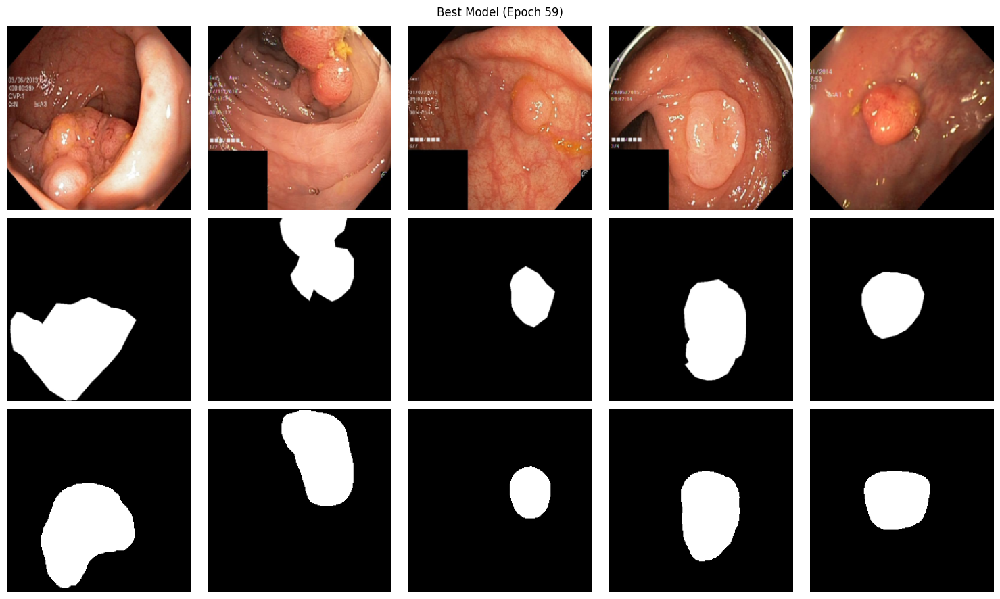

Epoch 60/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.18]



Epoch 60: Train Loss=3.3047 | Val Loss=3.2648 | Dice=0.6928 | IoU=0.5579



Epoch 61/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=3.29]



Epoch 61: Train Loss=3.2929 | Val Loss=3.0413 | Dice=0.7465 | IoU=0.6234

✅ Best model saved: checkpoints/best_model_epoch61_dice0.7465.pth


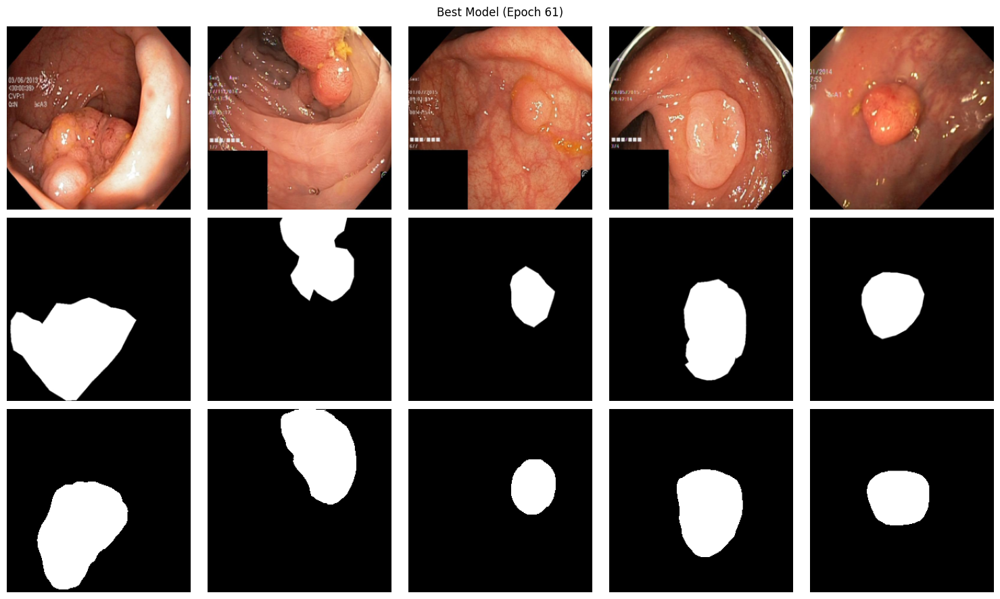

Epoch 62/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=4.91]



Epoch 62: Train Loss=3.2957 | Val Loss=3.0237 | Dice=0.6709 | IoU=0.5392



Epoch 63/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=2.88]



Epoch 63: Train Loss=3.2824 | Val Loss=2.9772 | Dice=0.7176 | IoU=0.5894



Epoch 64/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.54]



Epoch 64: Train Loss=3.2331 | Val Loss=2.9300 | Dice=0.7550 | IoU=0.6342

✅ Best model saved: checkpoints/best_model_epoch64_dice0.7550.pth


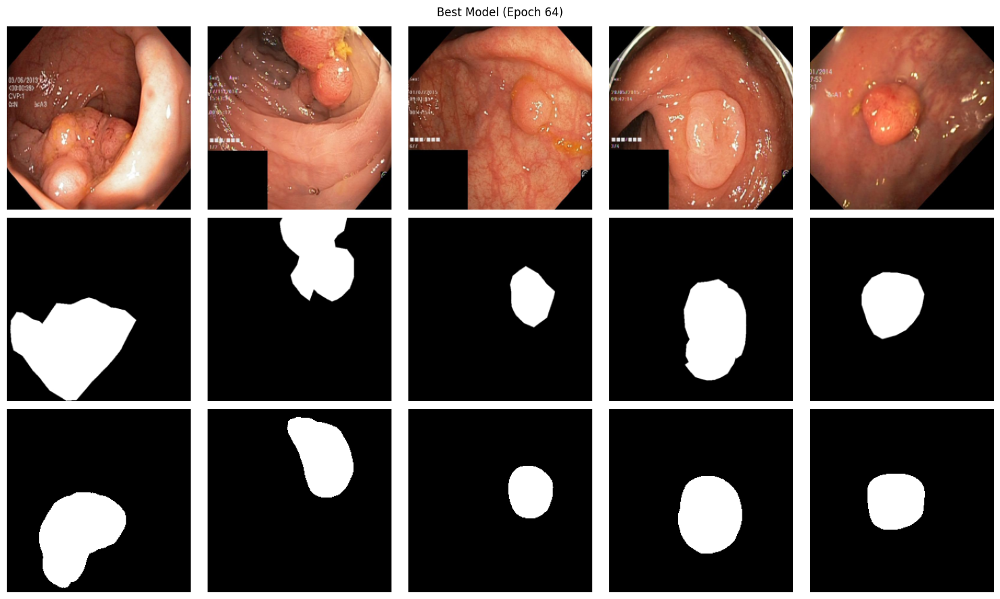

Epoch 65/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.12]



Epoch 65: Train Loss=3.2429 | Val Loss=3.0276 | Dice=0.7099 | IoU=0.5776



Epoch 66/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=2.67]



Epoch 66: Train Loss=3.2243 | Val Loss=3.0214 | Dice=0.7696 | IoU=0.6556

✅ Best model saved: checkpoints/best_model_epoch66_dice0.7696.pth


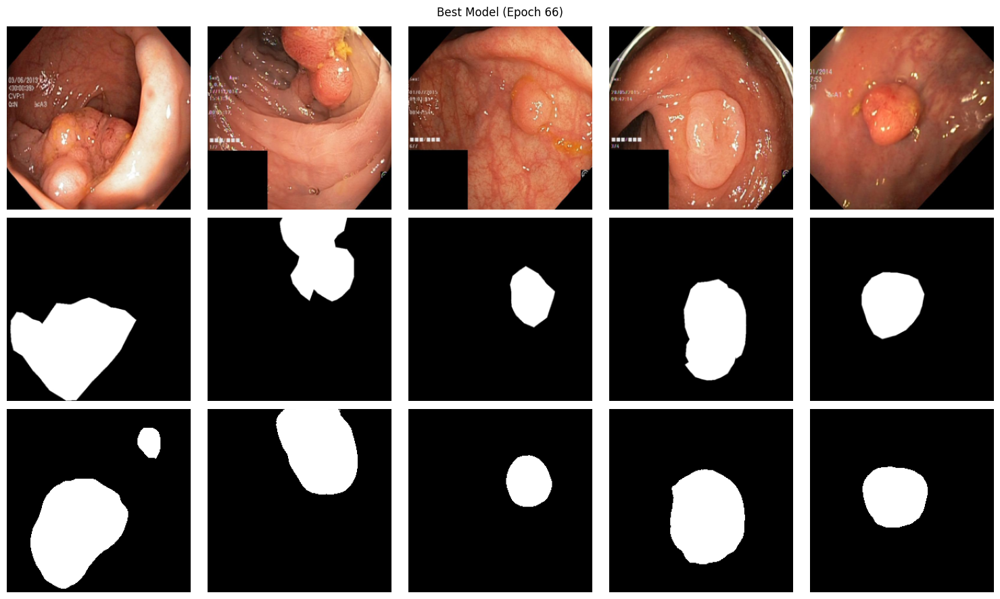

Epoch 67/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=4.03]



Epoch 67: Train Loss=3.2164 | Val Loss=3.0421 | Dice=0.7608 | IoU=0.6468



Epoch 68/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.63]



Epoch 68: Train Loss=3.1886 | Val Loss=3.0348 | Dice=0.7512 | IoU=0.6364



Epoch 69/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=4.31]



Epoch 69: Train Loss=3.1944 | Val Loss=2.9858 | Dice=0.7539 | IoU=0.6374



Epoch 70/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.76]



Epoch 70: Train Loss=3.1804 | Val Loss=2.8790 | Dice=0.7410 | IoU=0.6171



Epoch 71/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=2.82]



Epoch 71: Train Loss=3.1199 | Val Loss=2.8914 | Dice=0.7749 | IoU=0.6614

✅ Best model saved: checkpoints/best_model_epoch71_dice0.7749.pth


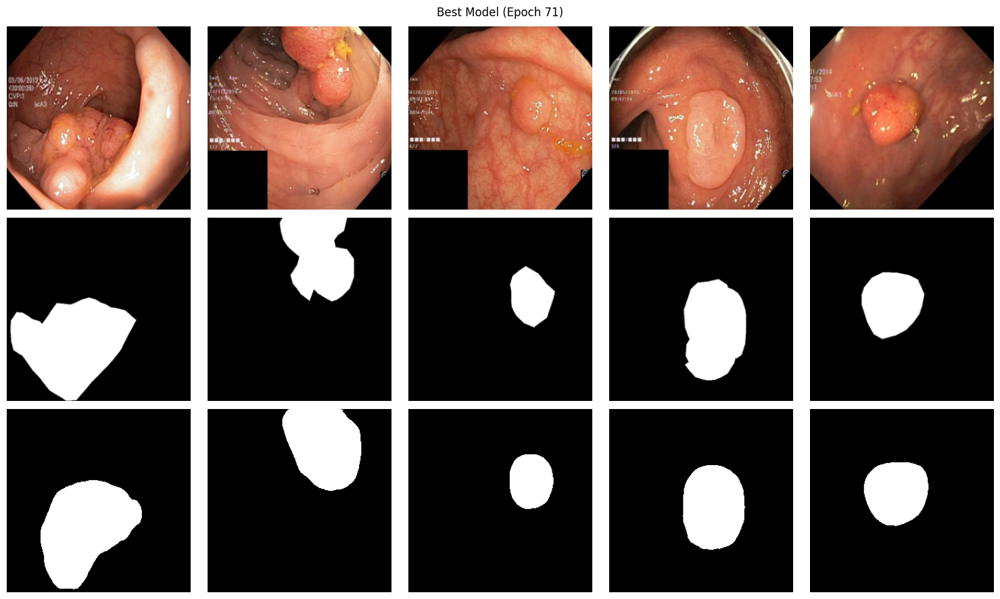

Epoch 72/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.92]



Epoch 72: Train Loss=3.1611 | Val Loss=2.9781 | Dice=0.7556 | IoU=0.6366



Epoch 73/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.82]



Epoch 73: Train Loss=3.1410 | Val Loss=2.9043 | Dice=0.7954 | IoU=0.6857

✅ Best model saved: checkpoints/best_model_epoch73_dice0.7954.pth


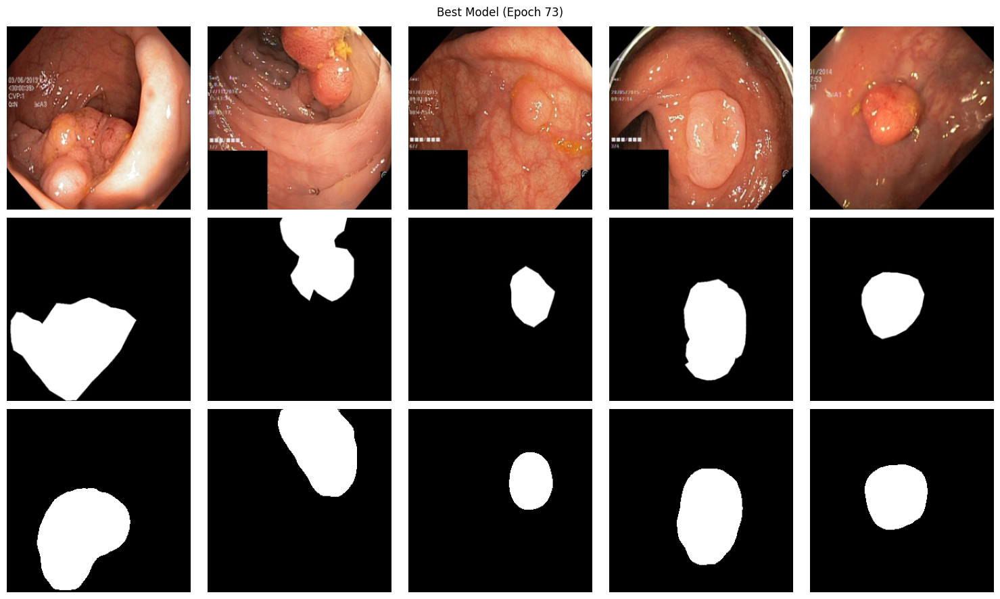

Epoch 74/100: 100%|██████████| 107/107 [01:16<00:00,  1.39it/s, loss=2.34]



Epoch 74: Train Loss=3.1111 | Val Loss=3.0310 | Dice=0.7605 | IoU=0.6493



Epoch 75/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.97]



Epoch 75: Train Loss=3.1008 | Val Loss=2.9113 | Dice=0.7749 | IoU=0.6691



Epoch 76/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=2.82]



Epoch 76: Train Loss=3.1017 | Val Loss=2.7729 | Dice=0.7748 | IoU=0.6632



Epoch 77/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.61]



Epoch 77: Train Loss=3.1317 | Val Loss=2.8026 | Dice=0.7889 | IoU=0.6832



Epoch 78/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=2.07]



Epoch 78: Train Loss=3.0618 | Val Loss=2.9135 | Dice=0.7686 | IoU=0.6579



Epoch 79/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.04]



Epoch 79: Train Loss=3.1080 | Val Loss=2.8660 | Dice=0.7479 | IoU=0.6265



Epoch 80/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=2.74]



Epoch 80: Train Loss=3.0961 | Val Loss=2.8223 | Dice=0.7767 | IoU=0.6661



Epoch 81/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=2.32]



Epoch 81: Train Loss=3.0343 | Val Loss=2.8365 | Dice=0.7673 | IoU=0.6586



Epoch 82/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=2.24]



Epoch 82: Train Loss=3.0383 | Val Loss=2.8260 | Dice=0.7751 | IoU=0.6712



Epoch 83/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=3.12]



Epoch 83: Train Loss=3.0654 | Val Loss=2.8434 | Dice=0.7792 | IoU=0.6712



Epoch 84/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=2.28]



Epoch 84: Train Loss=3.0133 | Val Loss=2.8849 | Dice=0.7639 | IoU=0.6508



Epoch 85/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=3.88]



Epoch 85: Train Loss=3.0128 | Val Loss=2.8165 | Dice=0.7726 | IoU=0.6648



Epoch 86/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=4.11]



Epoch 86: Train Loss=3.0063 | Val Loss=2.7622 | Dice=0.7844 | IoU=0.6798



Epoch 87/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.53]



Epoch 87: Train Loss=3.0352 | Val Loss=2.9180 | Dice=0.7822 | IoU=0.6710



Epoch 88/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=2.58]



Epoch 88: Train Loss=2.9865 | Val Loss=2.8673 | Dice=0.7804 | IoU=0.6712



Epoch 89/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=2.28]



Epoch 89: Train Loss=2.9967 | Val Loss=2.8088 | Dice=0.7321 | IoU=0.6086



Epoch 90/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.06]



Epoch 90: Train Loss=2.9720 | Val Loss=2.8499 | Dice=0.7440 | IoU=0.6203



Epoch 91/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=5.13]



Epoch 91: Train Loss=3.0151 | Val Loss=3.0945 | Dice=0.7735 | IoU=0.6633



Epoch 92/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.53]



Epoch 92: Train Loss=2.9929 | Val Loss=2.7957 | Dice=0.7760 | IoU=0.6660



Epoch 93/100: 100%|██████████| 107/107 [01:16<00:00,  1.41it/s, loss=2.09]



Epoch 93: Train Loss=2.9853 | Val Loss=2.8001 | Dice=0.7764 | IoU=0.6643



Epoch 94/100: 100%|██████████| 107/107 [01:15<00:00,  1.41it/s, loss=2.77]



Epoch 94: Train Loss=2.9503 | Val Loss=2.9385 | Dice=0.7930 | IoU=0.6836



Epoch 95/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.17]



Epoch 95: Train Loss=2.9793 | Val Loss=2.8258 | Dice=0.7705 | IoU=0.6576



Epoch 96/100: 100%|██████████| 107/107 [01:16<00:00,  1.39it/s, loss=2.44]



Epoch 96: Train Loss=2.9495 | Val Loss=2.9013 | Dice=0.7624 | IoU=0.6422



Epoch 97/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.04]



Epoch 97: Train Loss=2.9746 | Val Loss=2.7954 | Dice=0.7759 | IoU=0.6657



Epoch 98/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=2.87]



Epoch 98: Train Loss=2.9256 | Val Loss=2.8662 | Dice=0.7771 | IoU=0.6638



Epoch 99/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=1.73]



Epoch 99: Train Loss=2.9301 | Val Loss=2.8113 | Dice=0.7919 | IoU=0.6837



Epoch 100/100: 100%|██████████| 107/107 [01:16<00:00,  1.40it/s, loss=3.17]



Epoch 100: Train Loss=2.9392 | Val Loss=2.8026 | Dice=0.7842 | IoU=0.6756



In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
import os
import numpy as np
from scipy.ndimage import binary_dilation, binary_erosion

# --- Dice Loss ---
def dice_loss(pred, target, smooth=1.):
    pred = torch.sigmoid(pred)
    intersection = (pred * target).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice.mean()

# --- Morphological Gradient Boundary Loss ---
def morphological_gradient(tensor):
    tensor = tensor.detach().cpu().numpy()
    grad = []
    for i in range(tensor.shape[0]):
        mask = tensor[i, 0] > 0.5
        dilation = binary_dilation(mask, structure=np.ones((3, 3)))
        erosion = binary_erosion(mask, structure=np.ones((3, 3)))
        grad_map = dilation ^ erosion
        grad.append(grad_map.astype(np.float32))
    grad = np.stack(grad)[:, np.newaxis, :, :]
    return torch.tensor(grad)

def boundary_loss(pred, target):
    pred = torch.sigmoid(pred)
    pred_grad = morphological_gradient(pred).to(pred.device)
    target_grad = morphological_gradient(target).to(pred.device)
    return F.binary_cross_entropy(pred_grad, target_grad)

# --- Combined BCE + Dice + Boundary Loss ---
def combined_loss(preds, target, lambda_boundary=1.0):
    bce = nn.BCEWithLogitsLoss()
    weights = [0.6, 0.2, 0.1, 0.1]
    total_loss = 0
    for i, pred in enumerate(preds):
        loss_bce = bce(pred, target)
        loss_dice = dice_loss(pred, target)
        loss_bnd = boundary_loss(pred, target)
        total = loss_bce + loss_dice + lambda_boundary * loss_bnd
        total_loss += weights[i] * total
    return total_loss

# --- Metrics ---
def calc_metrics(pred, target):
    pred = torch.sigmoid(pred) > 0.5
    target = target.bool()
    intersection = (pred & target).float().sum((1, 2, 3))
    union = (pred | target).float().sum((1, 2, 3))
    iou = (intersection / (union + 1e-6)).mean()
    dice = (2 * intersection / (pred.sum((1, 2, 3)) + target.sum((1, 2, 3)) + 1e-6)).mean()
    return dice.item(), iou.item()

# --- TensorBoard Writer ---
writer = SummaryWriter(log_dir="runs/AttentionUNetPlusPlus")

# --- Training Loop ---
best_dice = 0.0
os.makedirs("checkpoints", exist_ok=True)
os.makedirs("visualizations", exist_ok=True)

for epoch in range(epochs):
    model.train()
    train_loss = 0
    with tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}") as pbar:
        for img, mask in pbar:
            img, mask = img.to(device), mask.to(device)
            optimizer.zero_grad()
            outputs = model(img)
            loss = combined_loss(outputs, mask)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            pbar.set_postfix({"loss": loss.item()})

    # --- Validation ---
    model.eval()
    val_loss, dice_total, iou_total = 0, 0, 0
    with torch.no_grad():
        for img, mask in val_loader:
            img, mask = img.to(device), mask.to(device)
            outputs = model(img)
            loss = combined_loss(outputs, mask)
            val_loss += loss.item()
            dice, iou = calc_metrics(outputs[0], mask)
            dice_total += dice
            iou_total += iou

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    avg_dice = dice_total / len(val_loader)
    avg_iou = iou_total / len(val_loader)

    print(f"\nEpoch {epoch+1}: "
          f"Train Loss={avg_train_loss:.4f} | "
          f"Val Loss={avg_val_loss:.4f} | "
          f"Dice={avg_dice:.4f} | IoU={avg_iou:.4f}\n")

    # --- TensorBoard Logging ---
    writer.add_scalar("Loss/Train", avg_train_loss, epoch)
    writer.add_scalar("Loss/Validation", avg_val_loss, epoch)
    writer.add_scalar("Metrics/Dice", avg_dice, epoch)
    writer.add_scalar("Metrics/IoU", avg_iou, epoch)

    # --- Save Best Model & Visualization ---
    if avg_dice > best_dice:
        best_dice = avg_dice
        ckpt_path = f"checkpoints/best_model_epoch{epoch+1}_dice{avg_dice:.4f}.pth"
        torch.save(model.state_dict(), ckpt_path)
        print(f"✅ Best model saved: {ckpt_path}")

        vis_path = f"visualizations/epoch{epoch+1}_dice{avg_dice:.4f}.png"
        visualize_predictions(val_loader, f"Best Model (Epoch {epoch+1})", save_path=vis_path)

        # Optional: Log predictions to TensorBoard
        inputs, targets = next(iter(val_loader))
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        if isinstance(outputs, tuple):
            outputs = outputs[0]
        preds = torch.sigmoid(outputs) > 0.5
        writer.add_images("Sample/Input", inputs[:4], epoch)
        writer.add_images("Sample/GroundTruth", targets[:4], epoch)
        writer.add_images("Sample/Prediction", preds[:4].float(), epoch)

writer.close()
